# Region Perturbation POC

Compared to previous notebooks, this notebook should integrate inpainting for the first time as a perturbation technique to the pixel-flipping/region perturbation algorithm.

## LRP

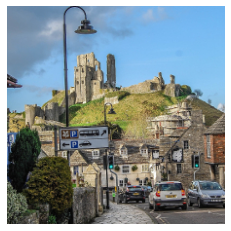

Finished 'relevance' in 0.4031 secs


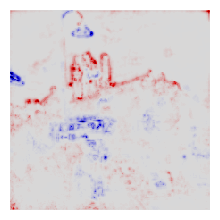

In [1]:
%load_ext autoreload
%autoreload 2

from typing import Callable, Dict, List, Tuple, Union

import numpy
import torch
import torchvision
from matplotlib import pyplot as plt

import lrp.plot
import lrp.rules as rules
from lrp import image
from lrp.core import LRP
from lrp.filter import LayerFilter
from lrp.rules import LrpEpsilonRule, LrpGammaRule, LrpZBoxRule, LrpZeroRule
from lrp.zennit.types import AvgPool, Linear

# Input data
# Image is in RGB mode with range [0,1]
img_bgr_hwc_float_0_1: numpy.array = image.load_img_norm_zero_one('../../../data/castle.jpg')
X = lrp.norm.ImageNetNorm.transform(img_bgr_hwc_float_0_1)
# Simulate batch by adding a new dimension
X = torch.unsqueeze(X, 0)

plt.axis('off')
lrp.plot.plot_imagenet(X)

# Model
model = torchvision.models.vgg16(pretrained=True)
model.eval()
# Low and high parameters for zB-rule
batch_size: int = 1
shape: Tuple[int] = (batch_size, 3, 224, 224)

low: torch.Tensor = lrp.norm.ImageNetNorm.normalize(torch.zeros(*shape))
high: torch.Tensor = lrp.norm.ImageNetNorm.normalize(torch.ones(*shape))

# Init layer filter
vgg16_target_types: Tuple[type] = (Linear, AvgPool)
filter_by_layer_index_type: LayerFilter = LayerFilter(model)
filter_by_layer_index_type.set_target_types(vgg16_target_types)

name_map: List[Tuple[List[str], rules.LrpRule, Dict[str, Union[torch.Tensor, float]]]]
name_map = [
    (filter_by_layer_index_type(lambda n: n == 0), LrpZBoxRule, {'low': low, 'high': high}),
    (filter_by_layer_index_type(lambda n: 1 <= n <= 16), LrpGammaRule, {'gamma': 0.25}),
    (filter_by_layer_index_type(lambda n: 17 <= n <= 30), LrpEpsilonRule, {'epsilon': 0.25}),
    (filter_by_layer_index_type(lambda n: 31 <= n), LrpZeroRule, {}),
]

lrp_instance: LRP = LRP(model)
lrp_instance.convert_layers(name_map)
R: torch.Tensor = lrp_instance.relevance(X)
lrp_instance.heatmap(R, width=2, height=2)

## Region Perturbation

Try Region Perturbation with inpainting enabled.

In [2]:
# %%script false --no-raise-error

from pf.core import PixelFlipping
from pf.objectives.constants import PixelFlippingObjectives
# Parameters for cell: input_nchw, relevance_scores_nchw, lrp_instance
from pf.perturbation_modes.constants import PerturbModes

perturbation_steps: int = 29
perturbation_size: int = 8

pixel_flipping_instance: PixelFlipping = PixelFlipping(perturbation_steps=perturbation_steps,
                                              perturbation_size=perturbation_size,
                                              perturb_mode=PerturbModes.INPAINTING,
                                              sort_objective=PixelFlippingObjectives.RANDOM)
input_nchw: torch.Tensor = X.clone().detach()

# Enable reproducibility
torch.manual_seed(42)

relevance_scores_nchw: torch.Tensor = R.clone().detach()

# Function should return the (single-class) classification score for the given input to measure the difference between flips.
forward_pass: Callable[[torch.Tensor], float] = lambda input_nchw: lrp_instance.model(input_nchw)[:,483]

# Run Pixel-Flipping algorithm
pf_gen = pixel_flipping_instance(input_nchw, relevance_scores_nchw, forward_pass, should_loop=False)

Finished '__call__' in 0.0004 secs


Finished '_flip' in 0.1601 secs
Finished 'calculate_auc_score' in 0.0001 secs


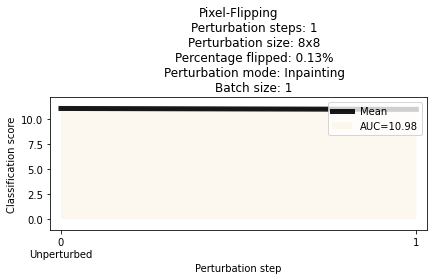

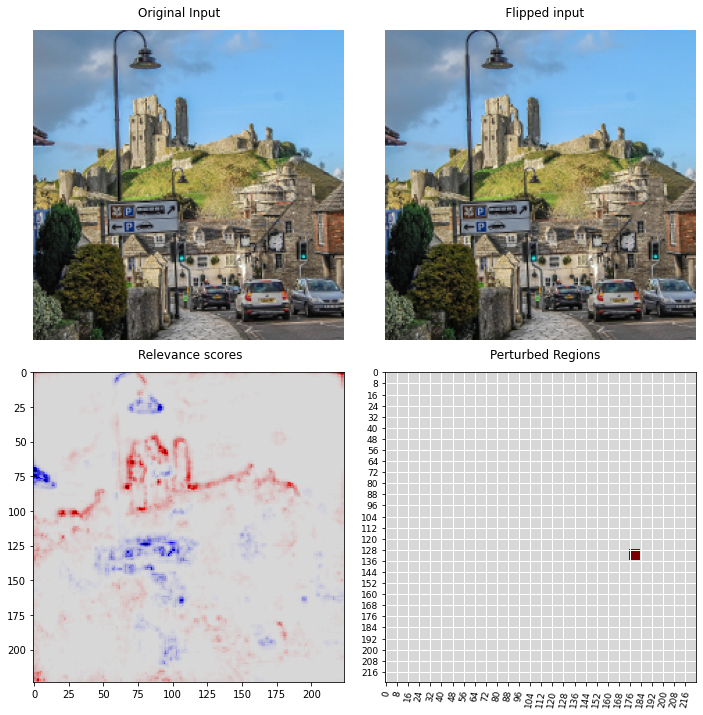

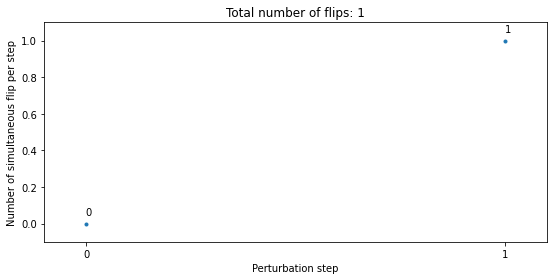

In [3]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1606 secs
Finished 'calculate_auc_score' in 0.0001 secs


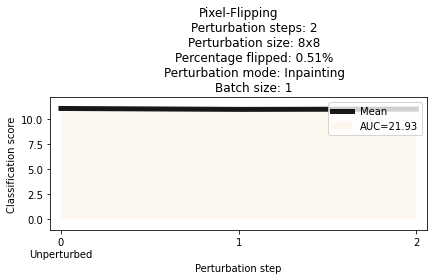

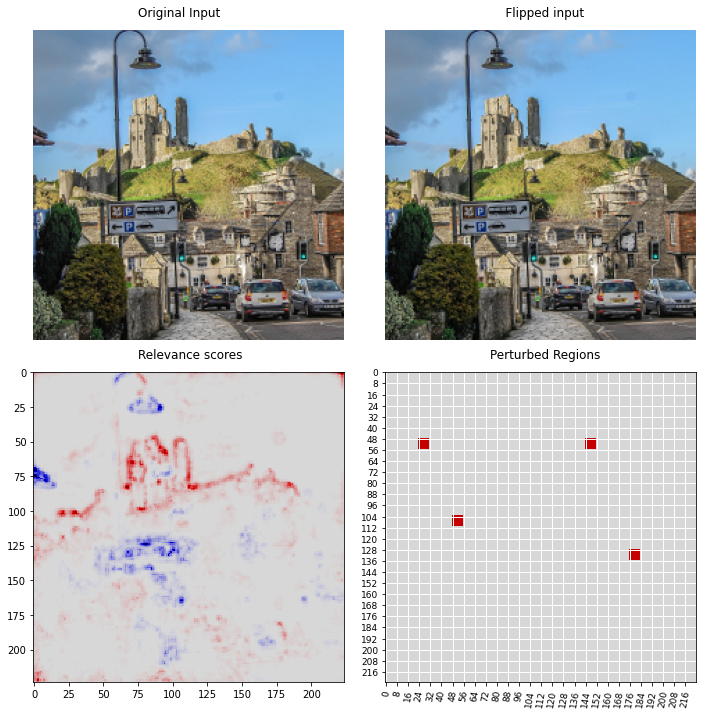

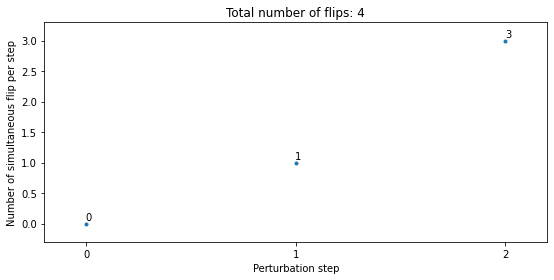

In [4]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1595 secs
Finished 'calculate_auc_score' in 0.0001 secs


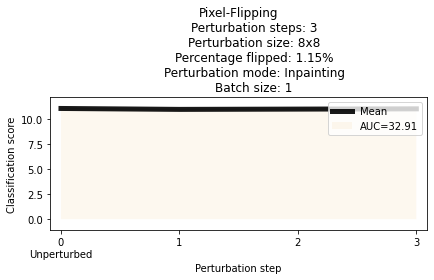

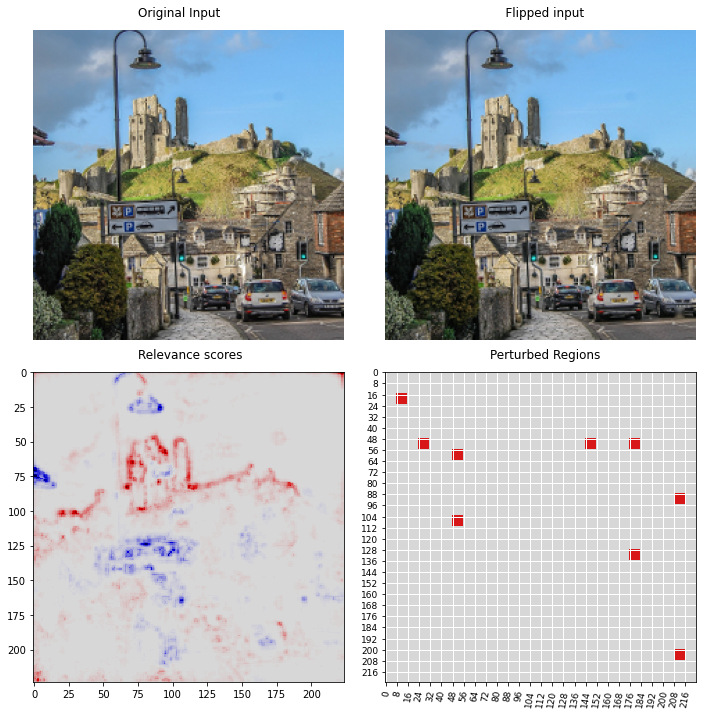

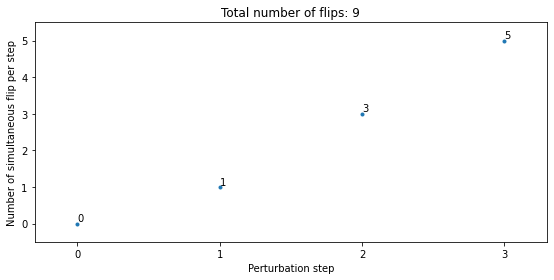

In [5]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.2282 secs
Finished 'calculate_auc_score' in 0.0001 secs


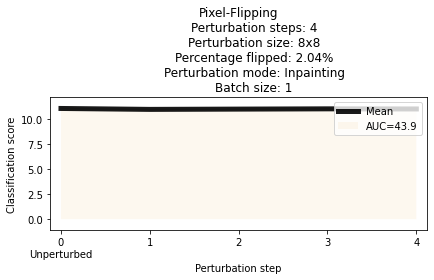

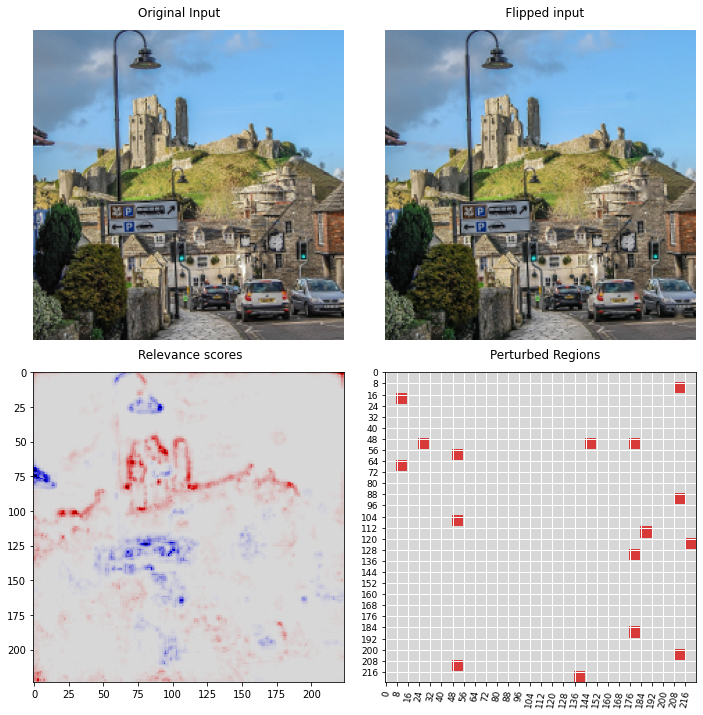

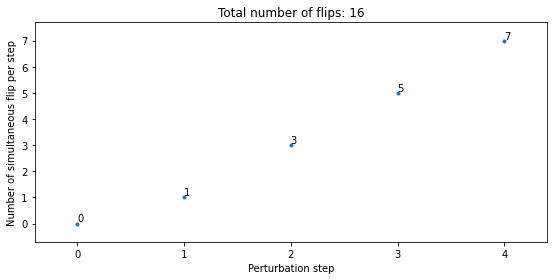

In [6]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1940 secs
Finished 'calculate_auc_score' in 0.0001 secs


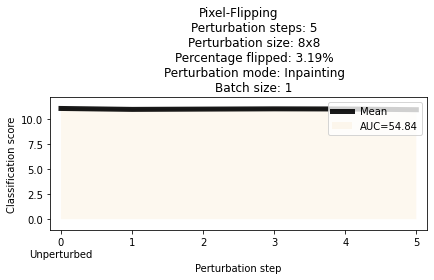

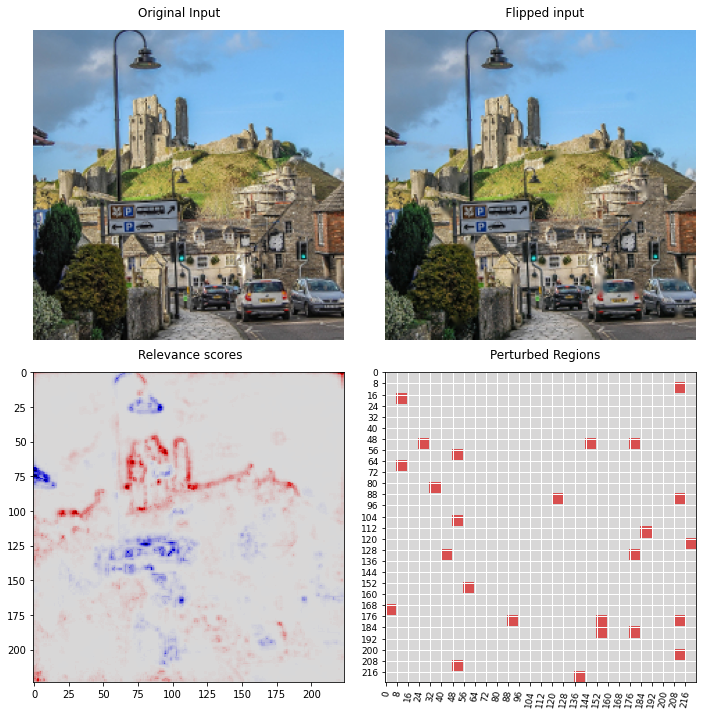

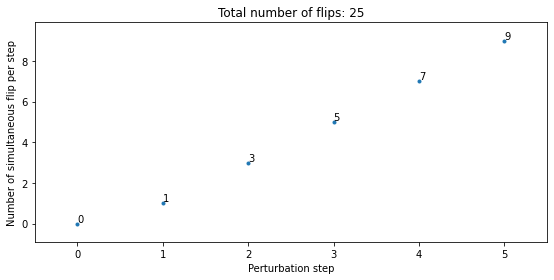

In [7]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1910 secs
Finished 'calculate_auc_score' in 0.0002 secs


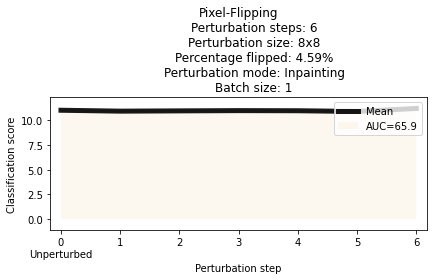

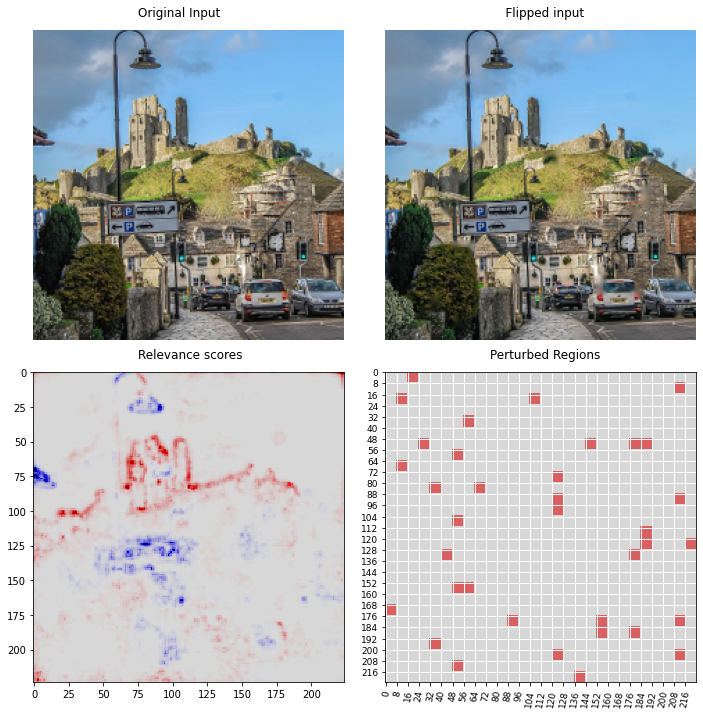

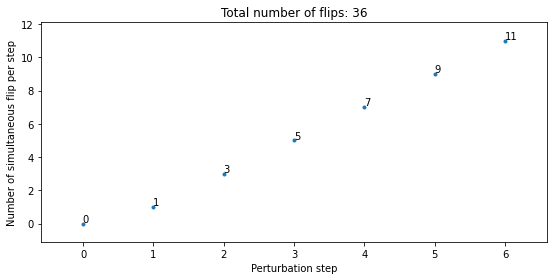

In [8]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1545 secs
Finished 'calculate_auc_score' in 0.0001 secs


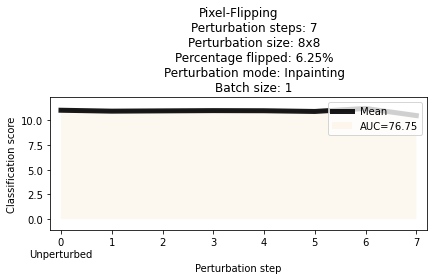

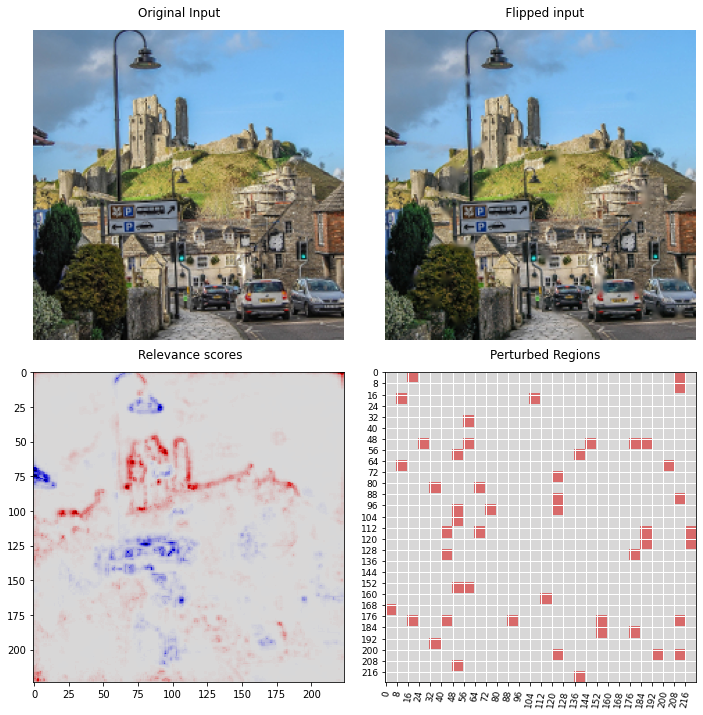

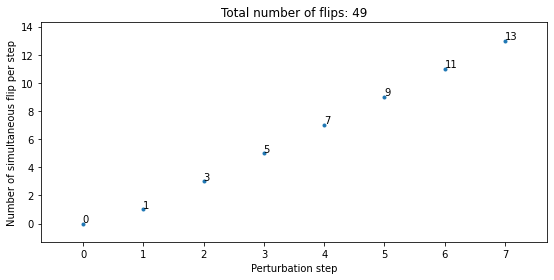

In [9]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1936 secs
Finished 'calculate_auc_score' in 0.0001 secs


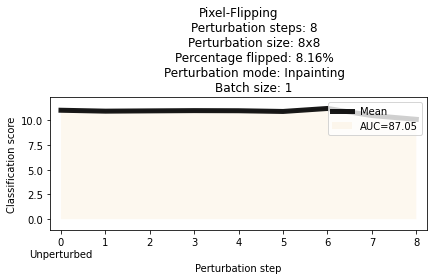

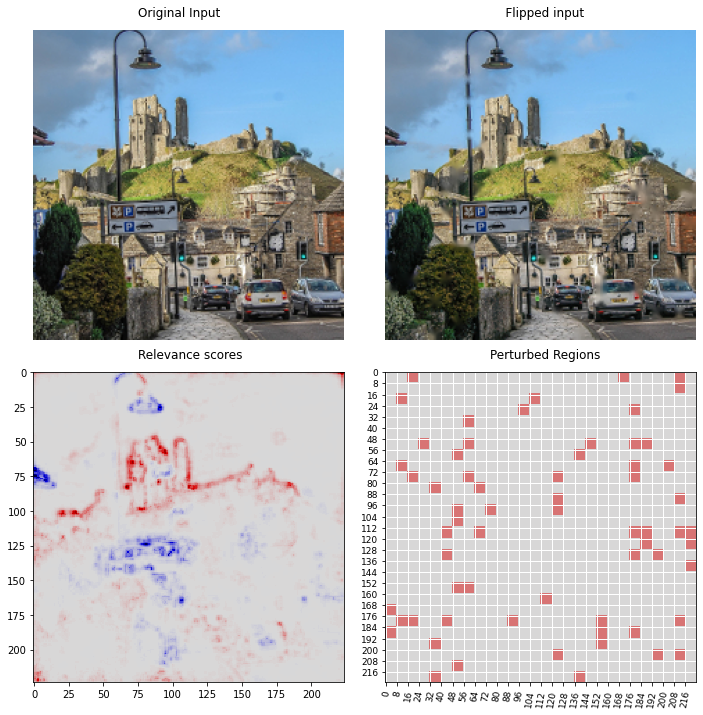

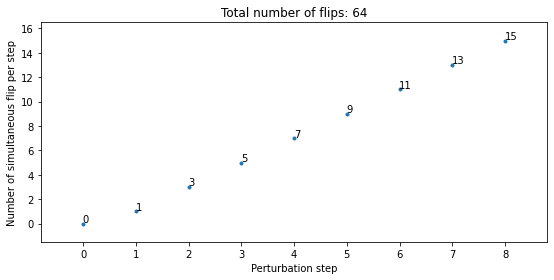

In [10]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1747 secs
Finished 'calculate_auc_score' in 0.0001 secs


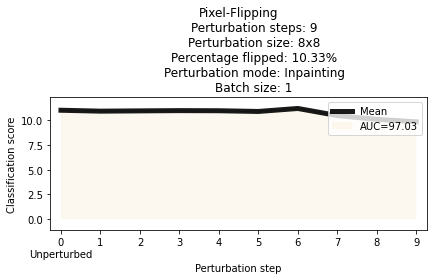

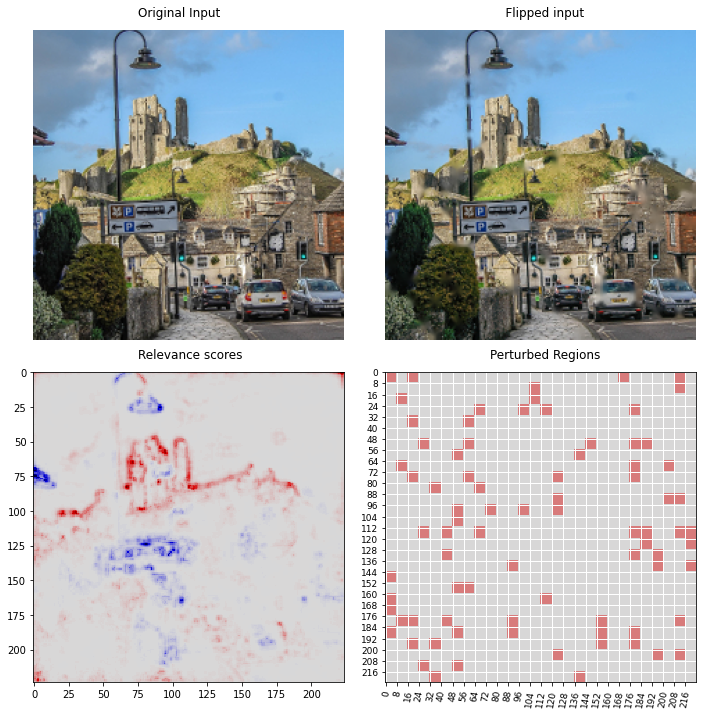

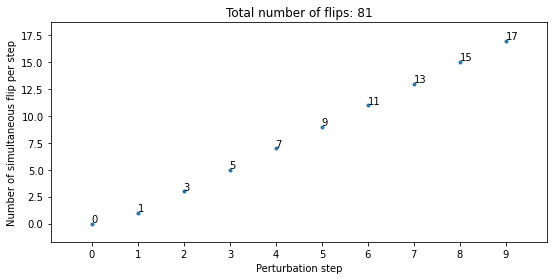

In [11]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1537 secs
Finished 'calculate_auc_score' in 0.0001 secs


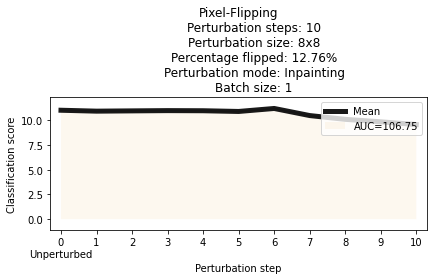

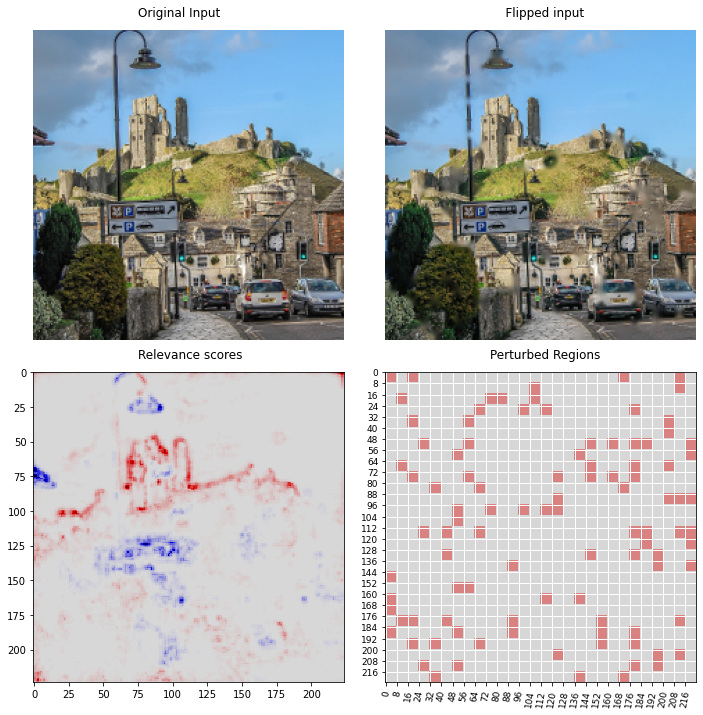

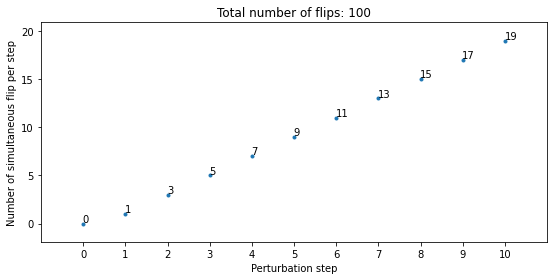

In [12]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1717 secs
Finished 'calculate_auc_score' in 0.0001 secs


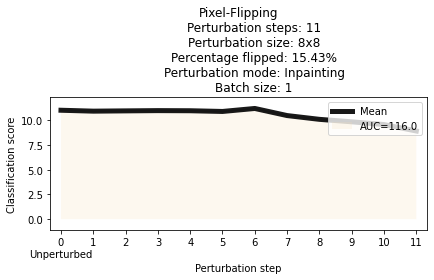

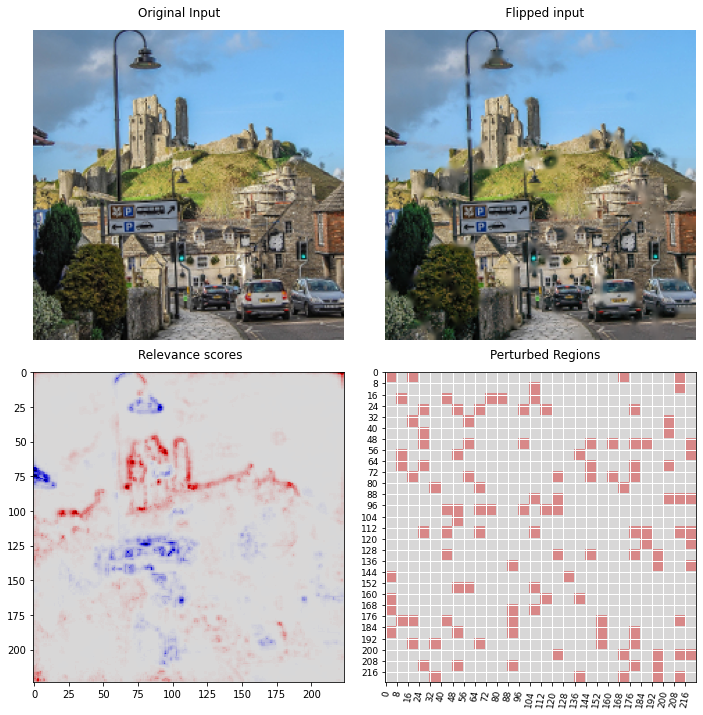

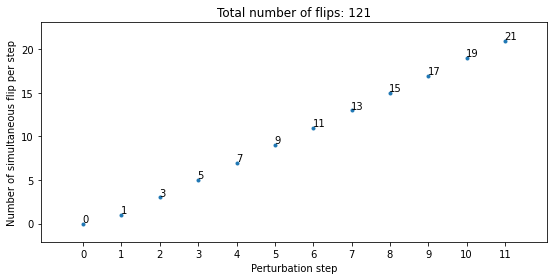

In [13]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.2024 secs
Finished 'calculate_auc_score' in 0.0001 secs


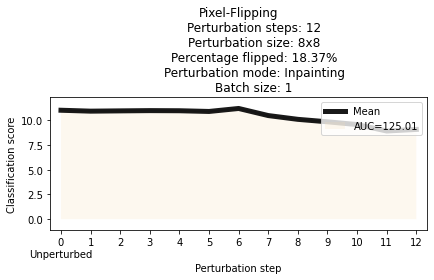

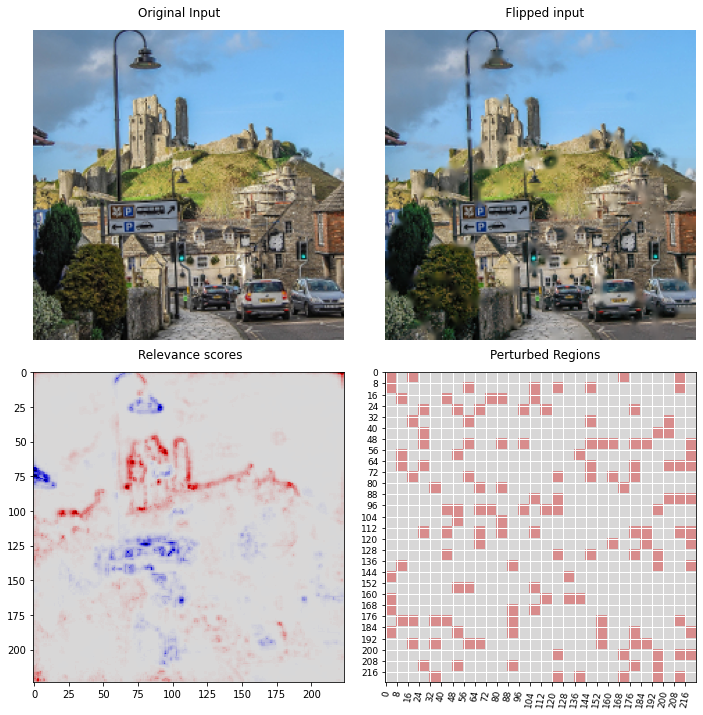

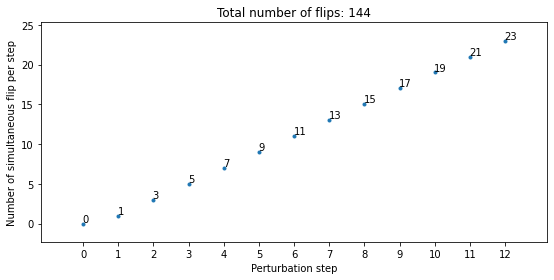

In [14]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1678 secs
Finished 'calculate_auc_score' in 0.0001 secs


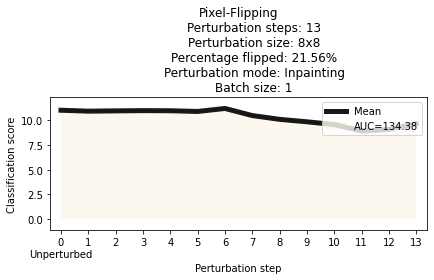

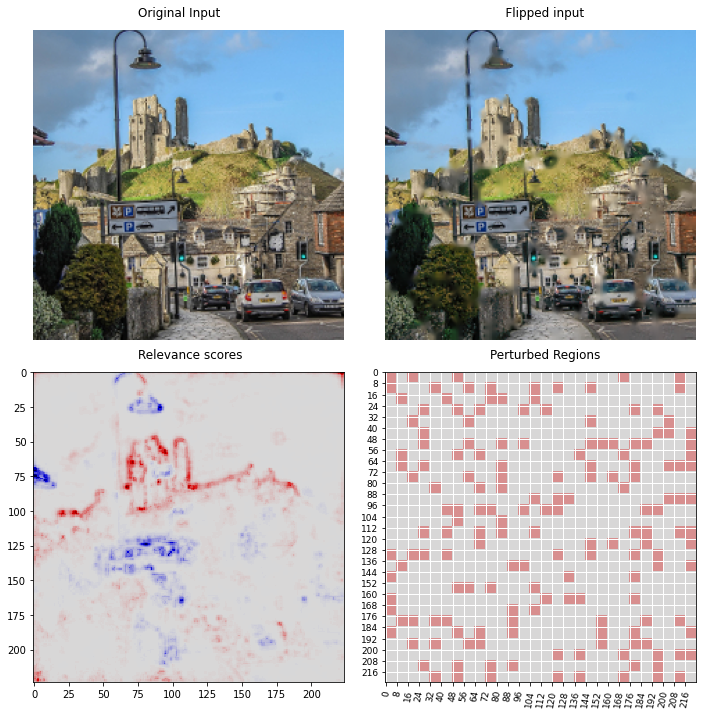

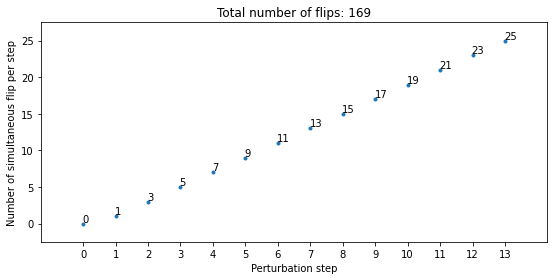

In [15]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1620 secs
Finished 'calculate_auc_score' in 0.0001 secs


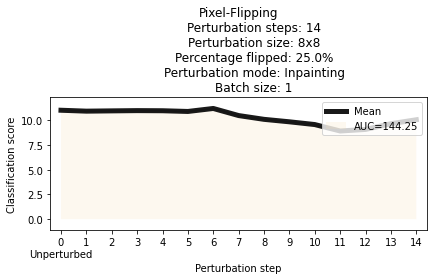

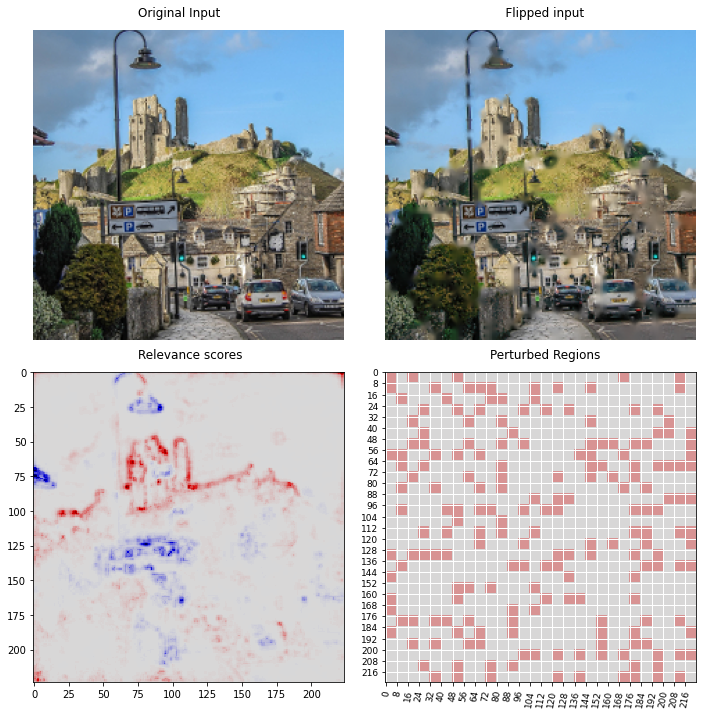

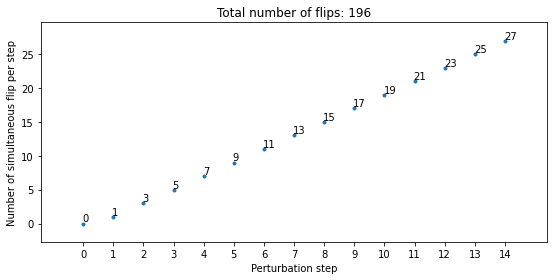

In [16]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1679 secs
Finished 'calculate_auc_score' in 0.0001 secs


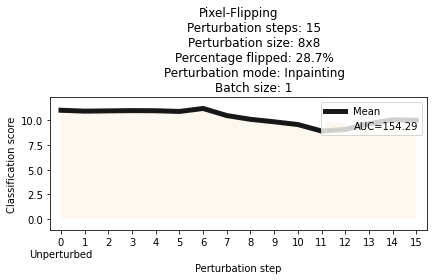

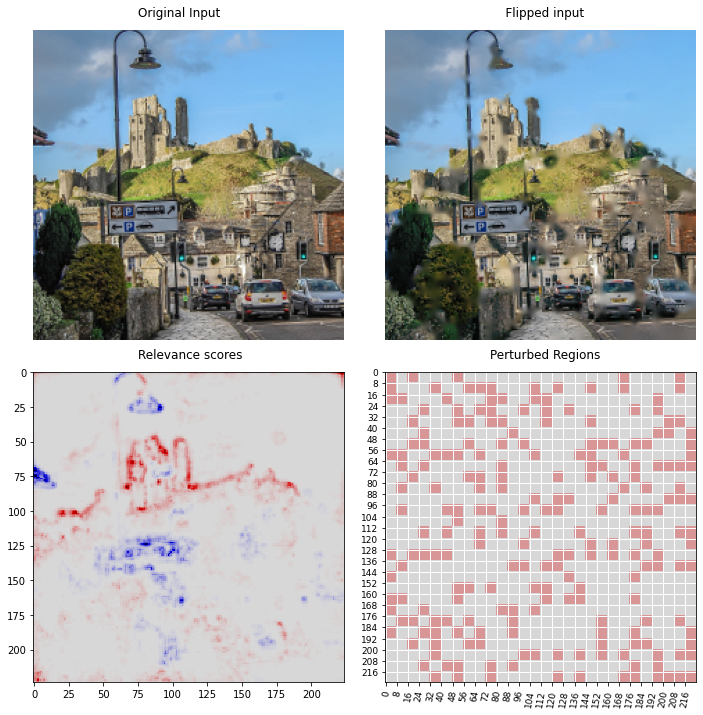

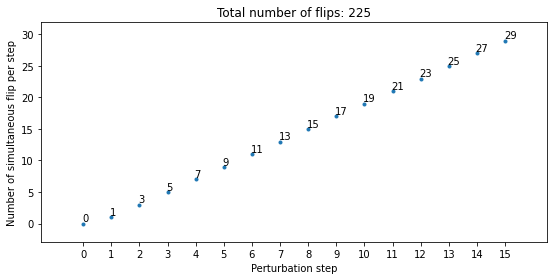

In [17]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1781 secs
Finished 'calculate_auc_score' in 0.0001 secs


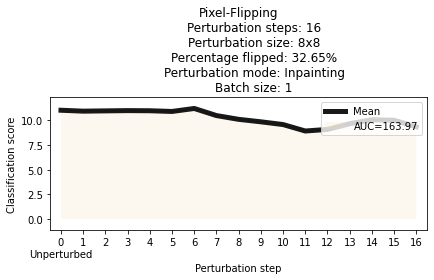

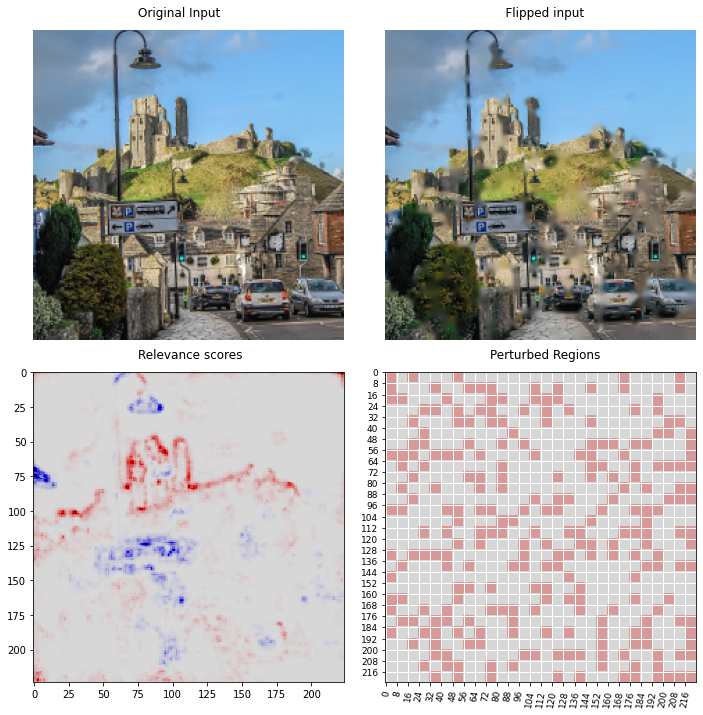

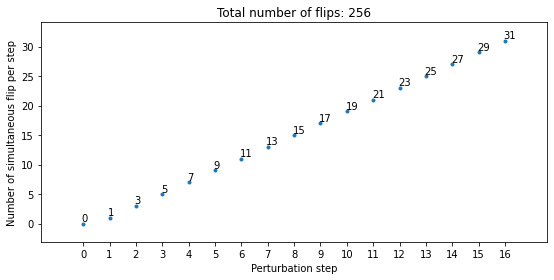

In [18]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1760 secs
Finished 'calculate_auc_score' in 0.0001 secs


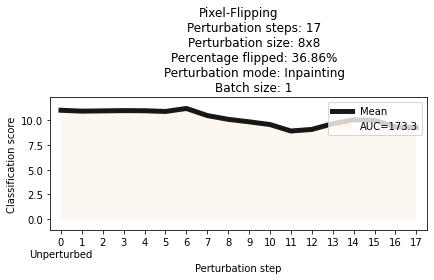

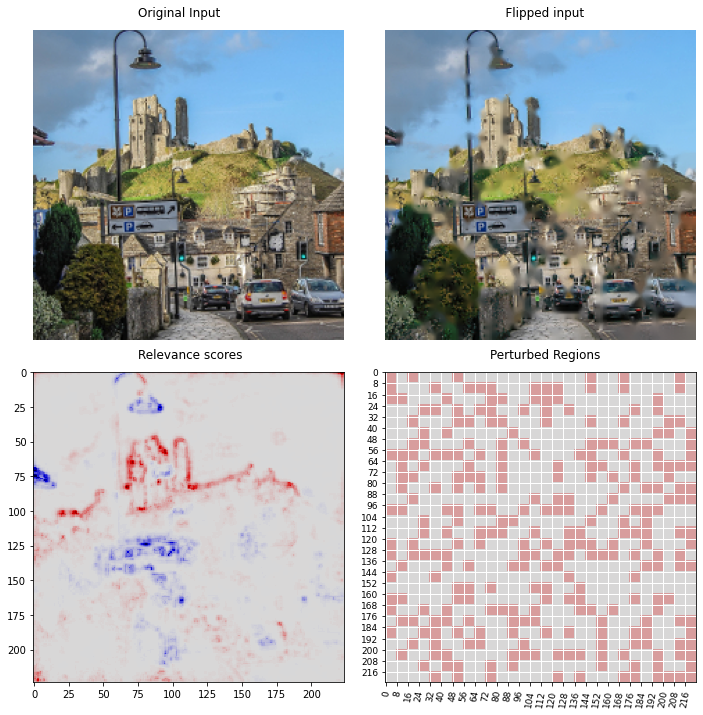

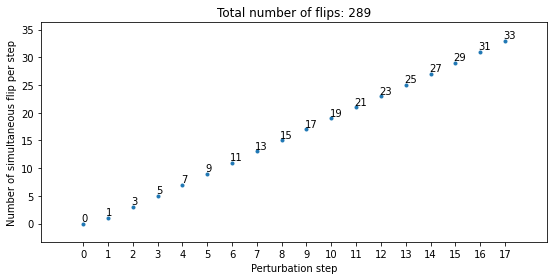

In [19]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1731 secs
Finished 'calculate_auc_score' in 0.0001 secs


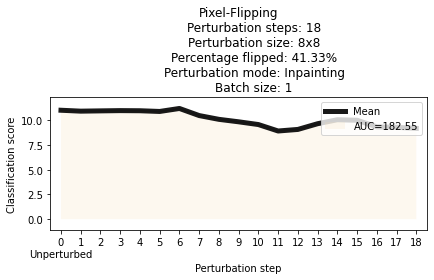

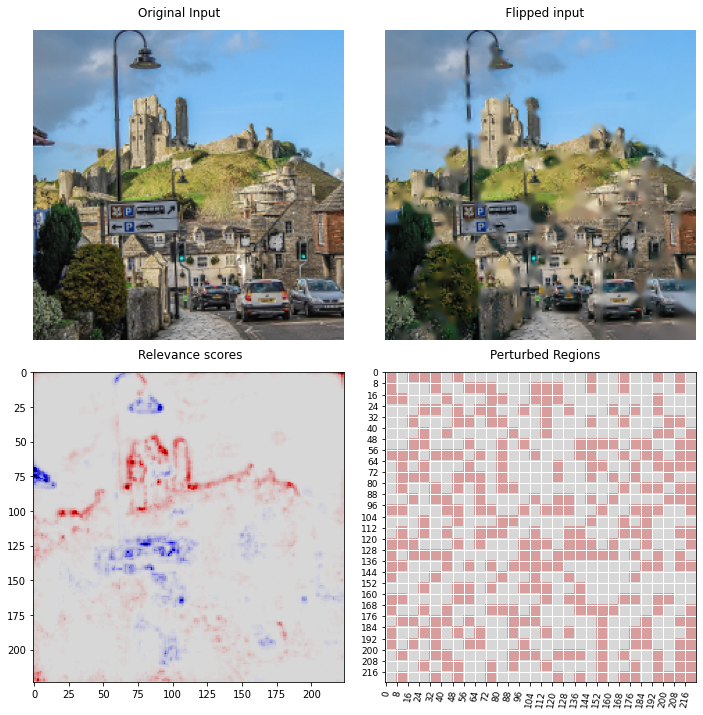

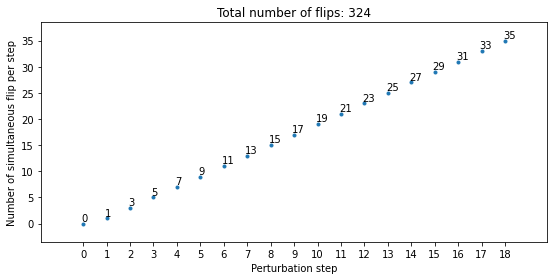

In [20]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1983 secs
Finished 'calculate_auc_score' in 0.0001 secs


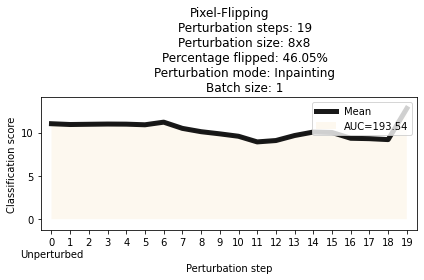

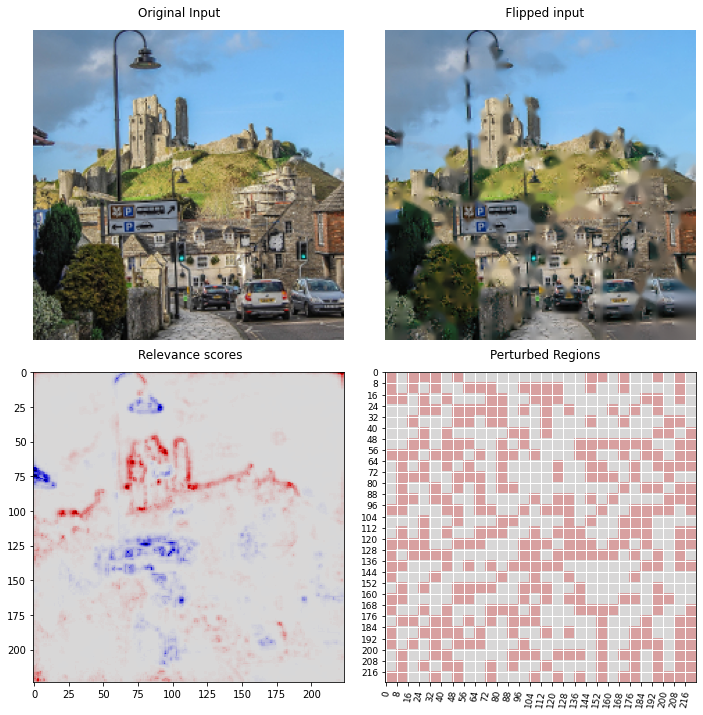

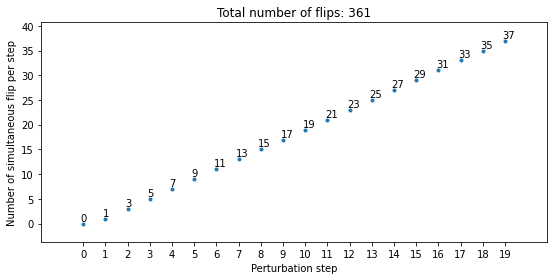

In [21]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1702 secs
Finished 'calculate_auc_score' in 0.0001 secs


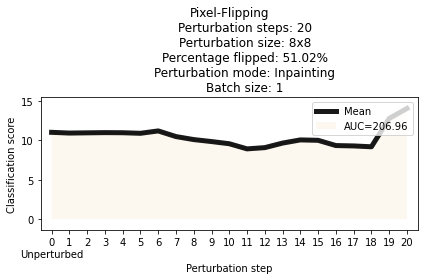

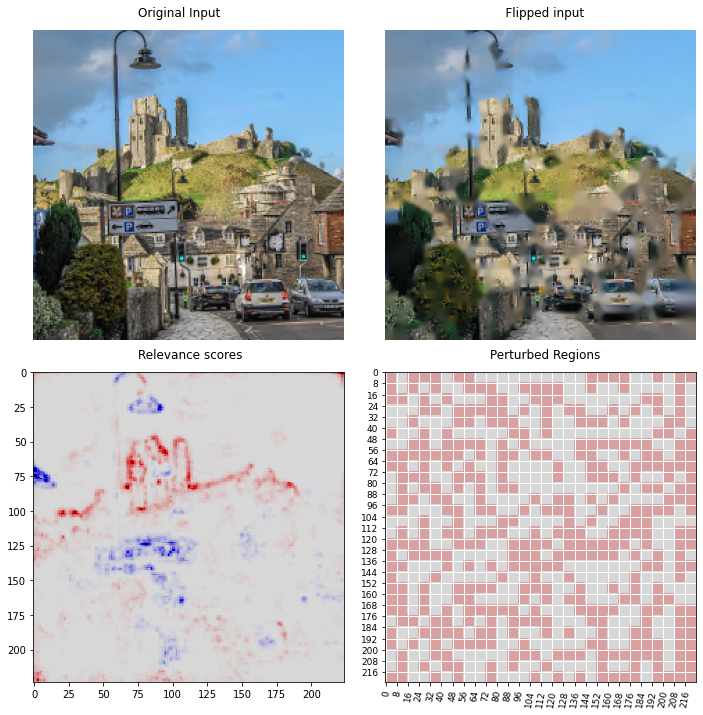

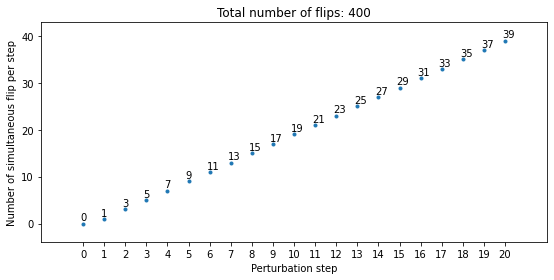

In [22]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1788 secs
Finished 'calculate_auc_score' in 0.0001 secs


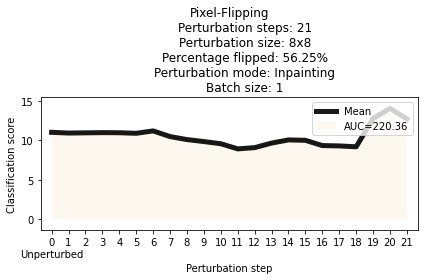

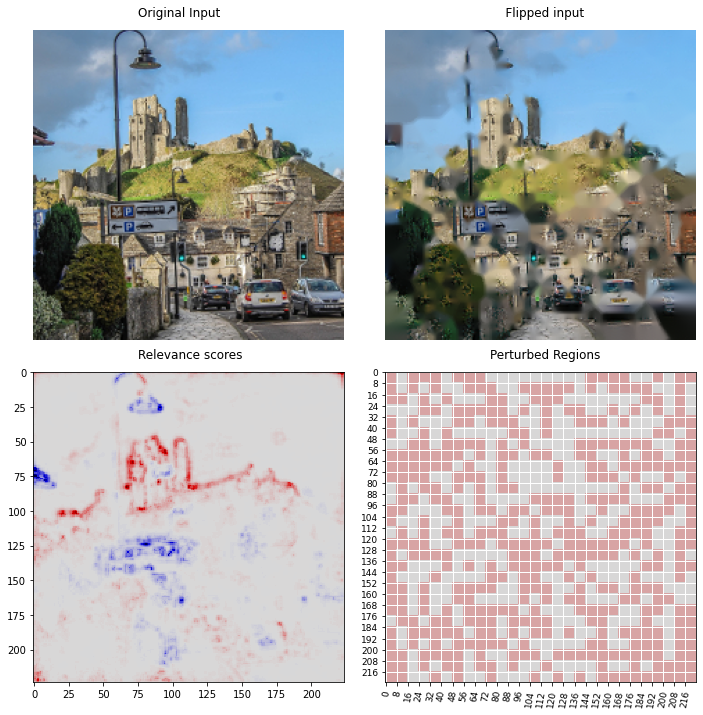

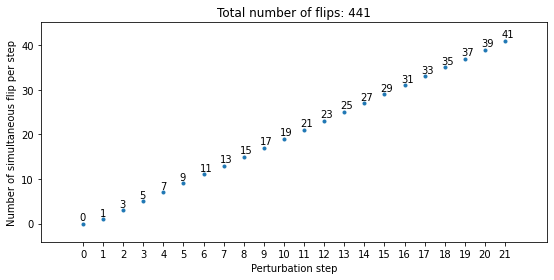

In [23]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1699 secs
Finished 'calculate_auc_score' in 0.0001 secs


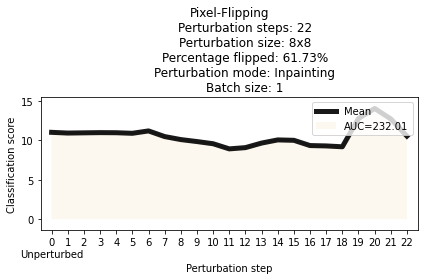

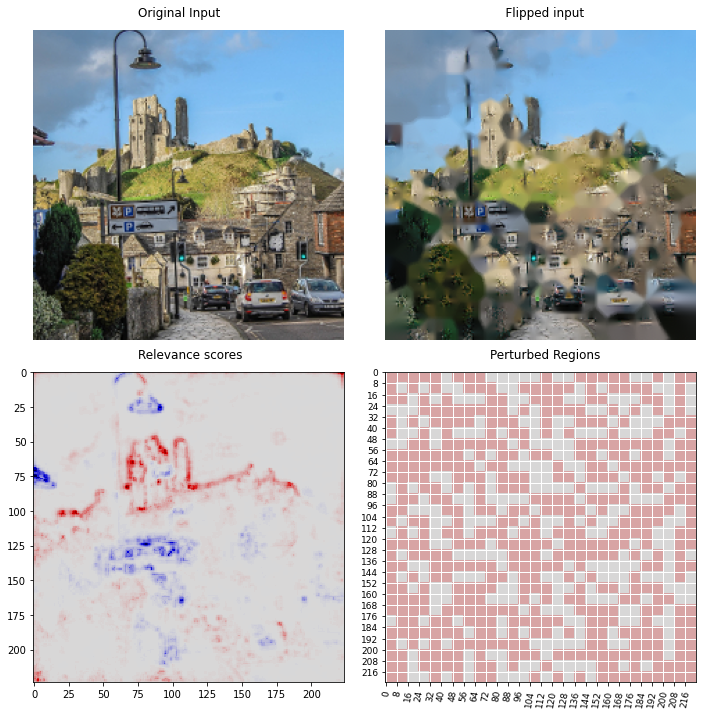

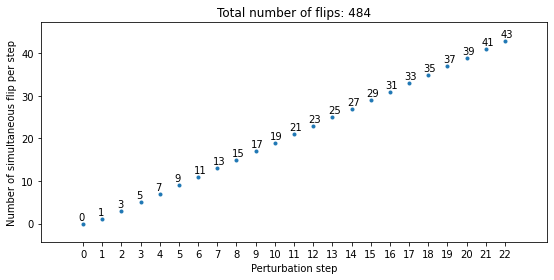

In [24]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1938 secs
Finished 'calculate_auc_score' in 0.0001 secs


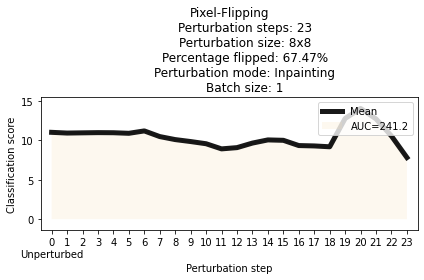

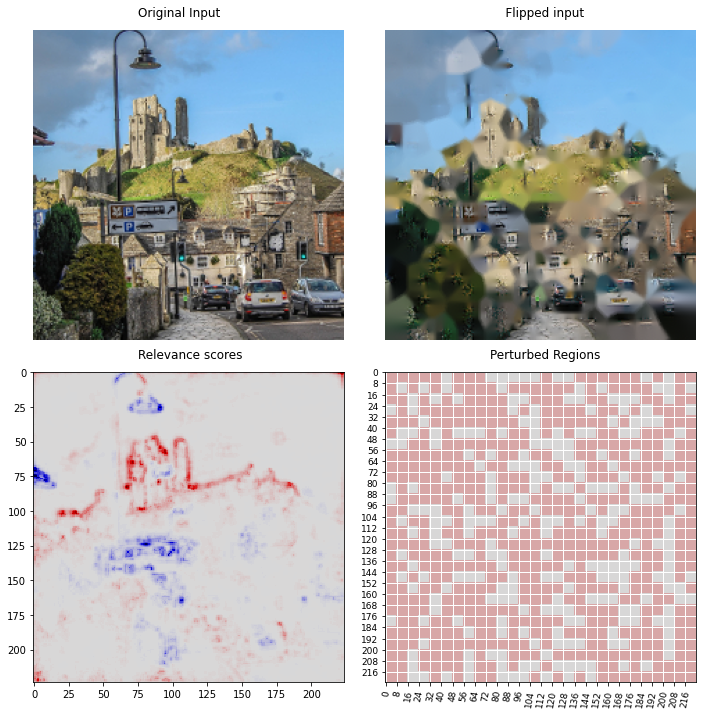

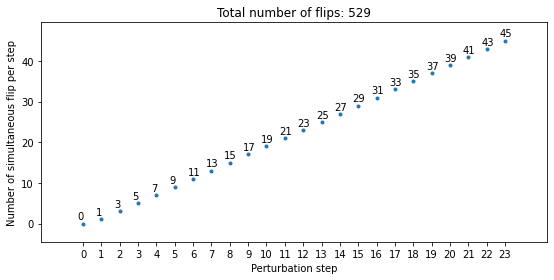

In [25]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1758 secs
Finished 'calculate_auc_score' in 0.0001 secs


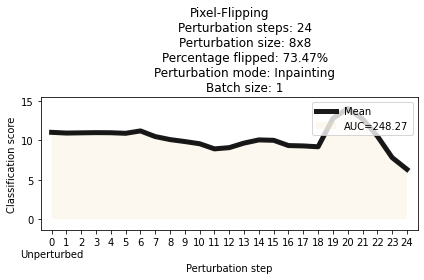

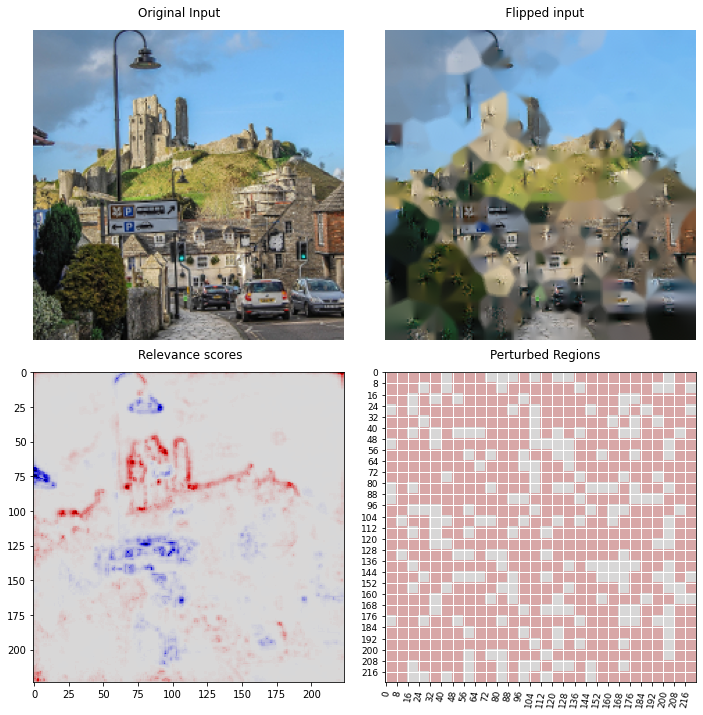

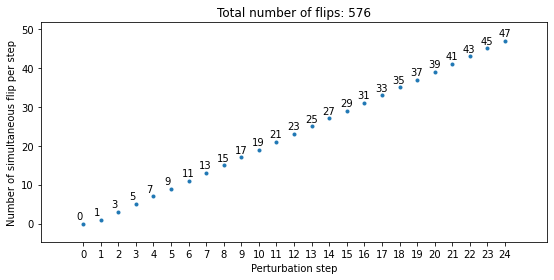

In [26]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1779 secs
Finished 'calculate_auc_score' in 0.0001 secs


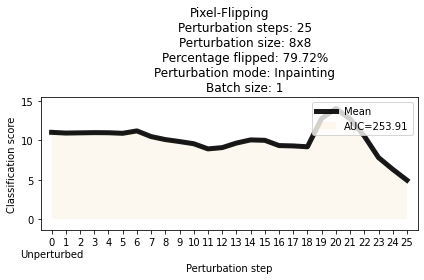

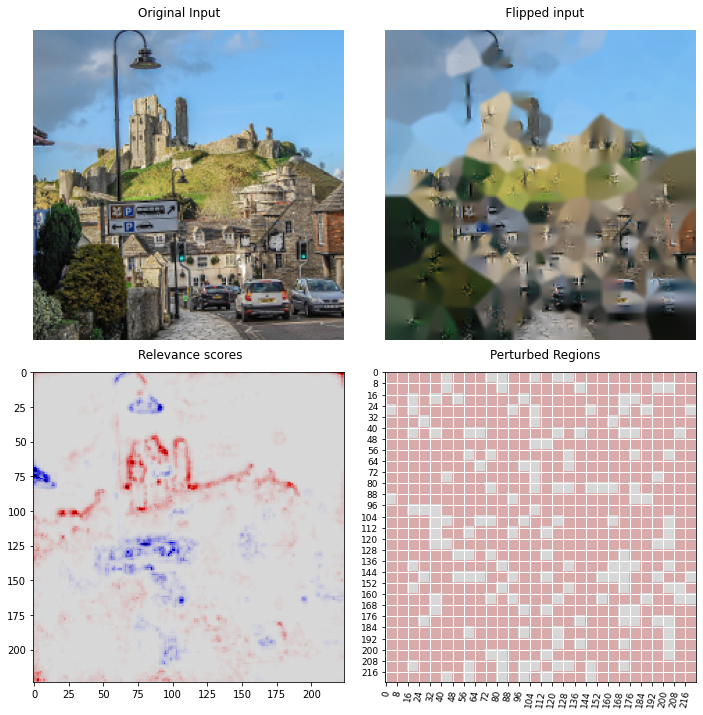

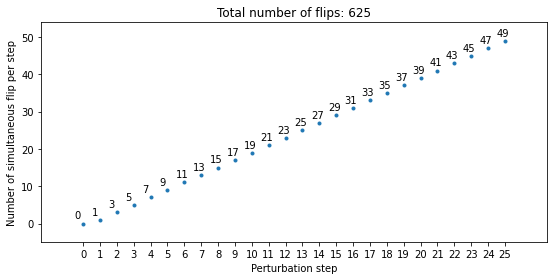

In [27]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1701 secs
Finished 'calculate_auc_score' in 0.0001 secs


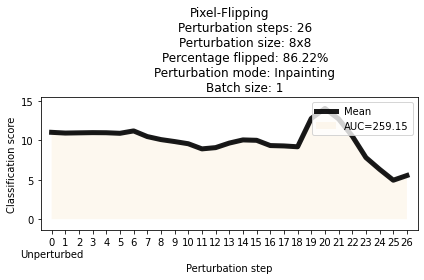

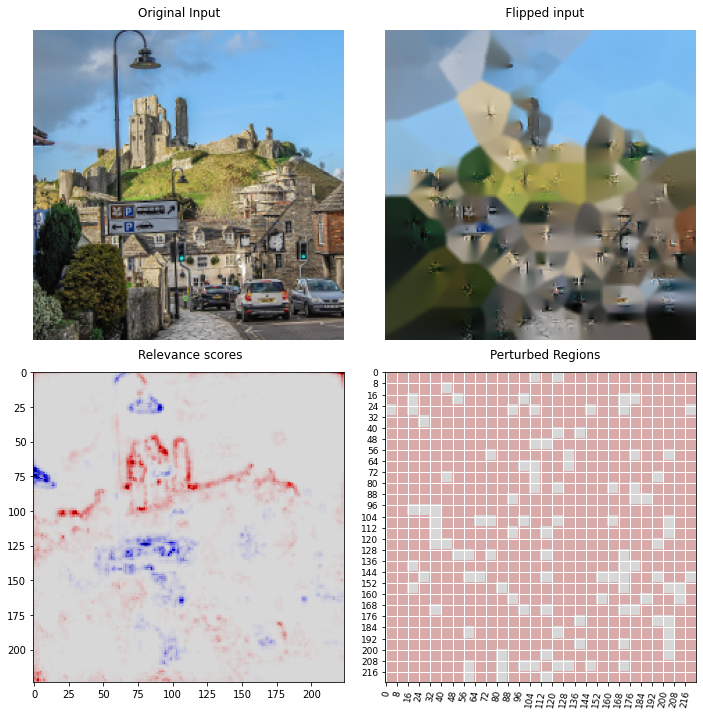

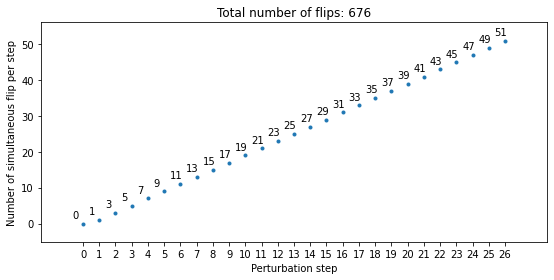

In [28]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1667 secs
Finished 'calculate_auc_score' in 0.0001 secs


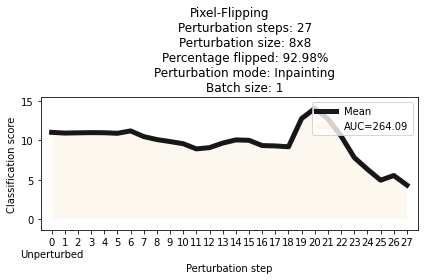

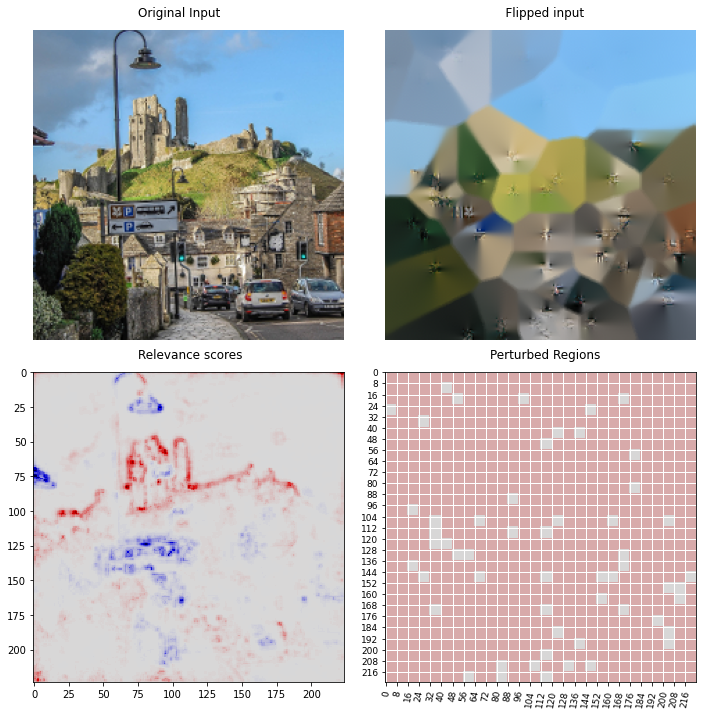

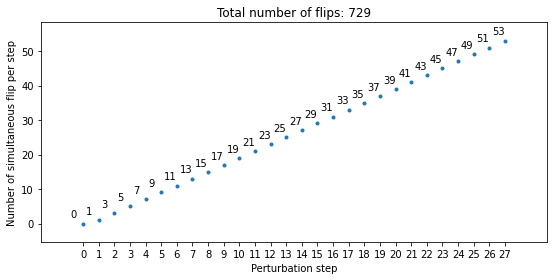

In [29]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1993 secs
Finished 'calculate_auc_score' in 0.0001 secs


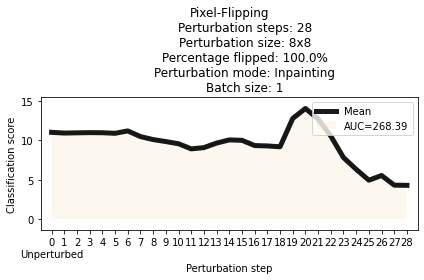

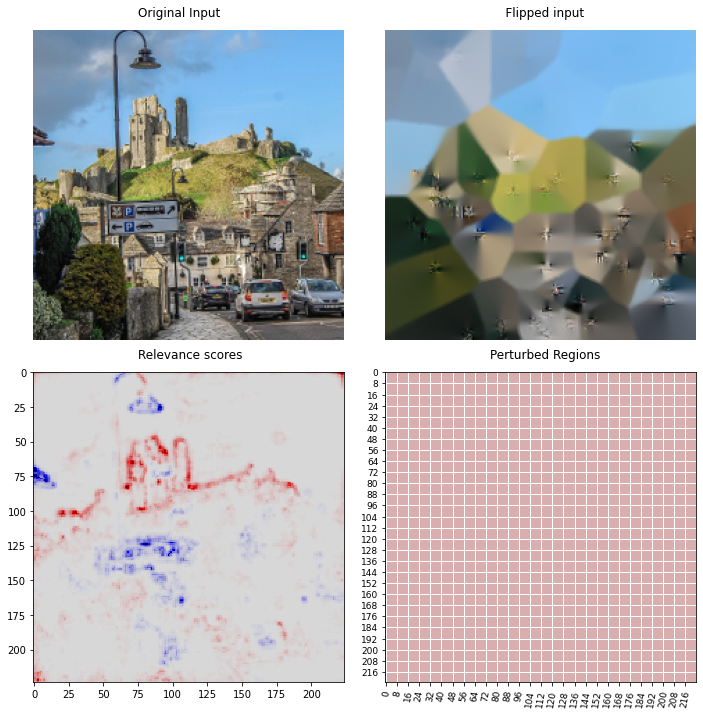

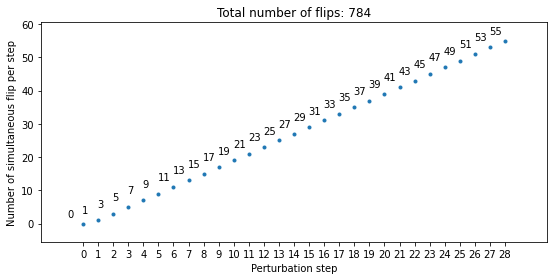

In [30]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()

Finished '_flip' in 0.1489 secs
Finished 'calculate_auc_score' in 0.0001 secs


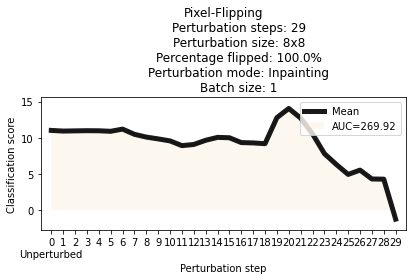

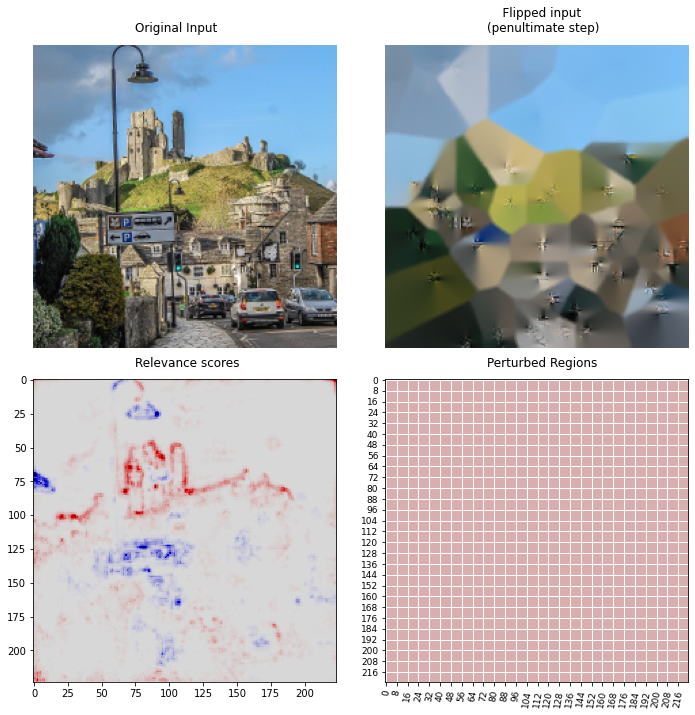

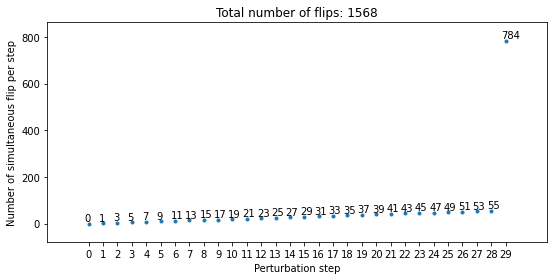

In [31]:
next(pf_gen)

pixel_flipping_instance.plot_class_prediction_scores()

pixel_flipping_instance.plot_image_comparison()

pixel_flipping_instance.plot_number_of_flips_per_step()